<a href="https://colab.research.google.com/github/prathammehta16/LowLightImageEnhancement/blob/main/SGP_7thsem.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#!pip install tf2onnx
!pip install onnxmltools

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 322.5/322.5 kB 3.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.7/294.7 kB 7.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.5/84.5 kB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 11.4 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 3.20.3
    Uninstalling protobuf-3.20.3:
      Successfully uninstalled protobuf-3.20.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.13.0 requires protobuf!=4.21.0,!=4.21.1,!=4.21.2,!=4.21.3,!=4.21.4,!=4.21.5,<5.0.0dev,>=3.20.3, but you have protobuf 3.20.2 which is incompatible.
tensorflow-metadata 1.14.0 requires protobuf<4.21,>=3.20.3, but you have protobuf 3.20.2 which is incompatible.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import numpy as np
import cv2
import imageio
import glob
import matplotlib.pyplot as plt
from tensorflow import keras
from tensorflow.keras import layers
from scipy import ndimage

In [ ]:
#!unzip /content/drive/MyDrive/projects/SGP_7thsem/LOLdataset.zip

In [ ]:
path = r'/content/LOLdataset/our485/high'
all_files = glob.glob(path + "/*.png")
high = list()
all_files.sort()
for fileName in all_files:
        img = imageio.imread(fileName)
        high.append(img)
high = np.array(high)

path = r'/content/LOLdataset/our485/low'
all_files = glob.glob(path + "/*.png")
all_files.sort()
low = list()
for fileName in all_files:
        img = imageio.imread(fileName)
        low.append(img)
low = np.array(low)

<ipython-input-5-ccf33afdc4f5>:6: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(fileName)
<ipython-input-5-ccf33afdc4f5>:15: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(fileName)


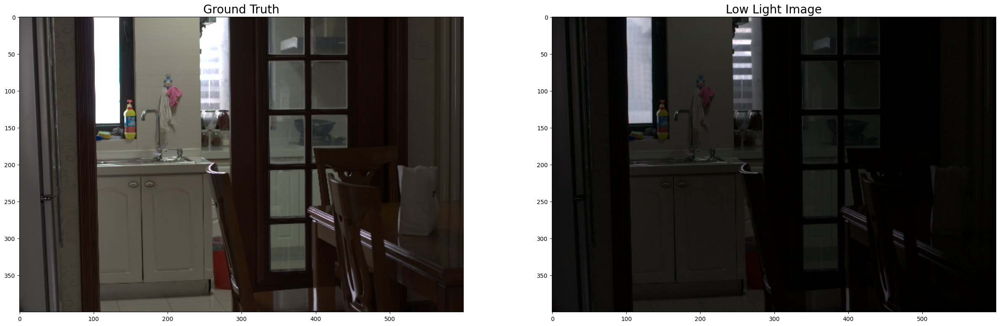

In [ ]:
plt.figure(figsize=(30,30))
plt.subplot(1,2,1)
plt.title("Ground Truth",fontsize=20)
plt.imshow(high[3])

plt.subplot(1,2,2)
plt.title("Low Light Image",fontsize=20)
plt.imshow(low[3])

In [ ]:
inputs = keras.Input(shape=(None, None, 3), name='img')
out1 = layers.Conv2D(32, (3,3), activation='relu', padding="same", strides=(1, 1))(inputs)
out2 = layers.Conv2D(32, (3,3), activation='relu', padding="same", strides=(1, 1))(out1)
out3 = layers.Conv2D(32, (3,3), activation='relu', padding="same", strides=(1, 1))(out2)
out4 = layers.Conv2D(32, (3,3), activation='relu', padding="same", strides=(1, 1))(out3)
in5 = layers.add([out3, out4])
out5 = layers.Conv2D(32, (3,3), activation='relu', padding="same", strides=(1, 1))(in5)
in6 = layers.add([out2, out5])
out6 = layers.Conv2D(32, (3,3), activation='relu', padding="same", strides=(1, 1))(in6)
in7 = layers.add([out1, out6])
outputs = layers.Conv2D(1, (3,3), activation='sigmoid', padding="same", strides=(1, 1))(in7)
model = keras.Model(inputs, outputs)

model.compile(optimizer="adam", loss='mean_squared_error')
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 img (InputLayer)            [(None, None, None, 3)]      0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, None, None, 32)       896       ['img[0][0]']                 
                                                                                                  
 conv2d_1 (Conv2D)           (None, None, None, 32)       9248      ['conv2d[0][0]']              
                                                                                                  
 conv2d_2 (Conv2D)           (None, None, None, 32)       9248      ['conv2d_1[0][0]']            
                                                                                              

In [ ]:
def GenerateInputs(X,y):
    for i in range(len(X)):
        # Here we will reshape the input images from it's original size to (1,400,600)
        X_input = X[i].reshape(1,400,600,3)
        # Normalizing the image
        y_temp = y[i] / 255
        # Here we will reshape the enhanced images from it's original size to (1,400,600)
        y_input = y_temp.reshape(1,400,600,3)
        yield (X_input,y_input)

# Fitting our Model
model.fit(GenerateInputs(low,high), epochs=2, verbose=1, steps_per_epoch=24)

Epoch 1/2
24/24 [==============================] - 103s 4s/step - loss: 0.0944
Epoch 2/2
24/24 [==============================] - 98s 4s/step - loss: 0.0454


In [ ]:
model.save(r'/content/ourModel.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
from keras.models import load_model
Model_Enhancer = load_model(r'/content/ourModel.h5')

In [ ]:
path = r'/content/LOLdataset/our485/low'
all_files = glob.glob(path + "/*")
x = list()
all_files.sort()
for fileName in all_files:
        img = imageio.imread(fileName)
        x.append(img)
X = np.array(x)

<ipython-input-45-357e70fff9f5>:6: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(fileName)


1/1 [==============================] - 1s 1s/step


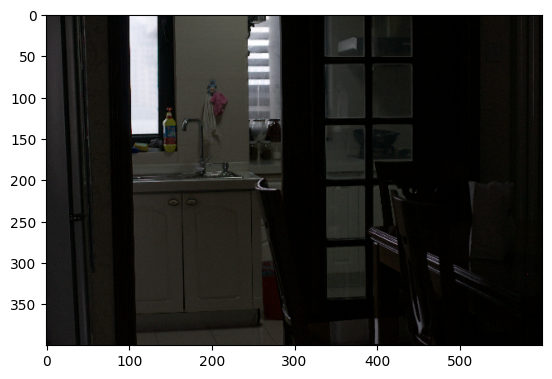

In [ ]:
# 1 iteration only
img = X[3]
h, w,c = img.shape
test = Model_Enhancer.predict(img.reshape(1,h,w,c))
img = img/255
image = img + ((test[0,:,:,:] * img)*(1-img))
plt.imshow(image)

1/1 [==============================] - 1s 570ms/step


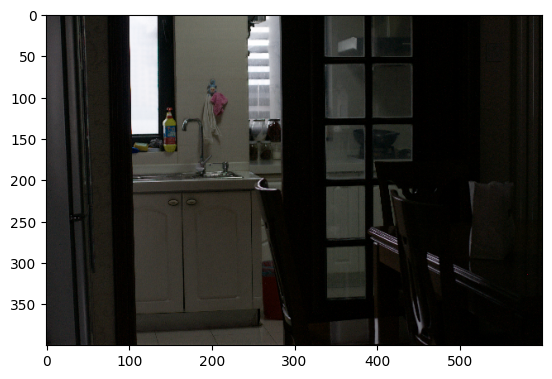

In [ ]:
img = X[3]
h, w,c = img.shape
test = Model_Enhancer.predict(img.reshape(1,h,w,c))
img = img/255
image = img + ((test[0,:,:,:] * img)*(1-img))

test = Model_Enhancer.predict(image.reshape(1,h,w,c))
# img = img/255
image = image + ((test[0,:,:,:] * image)*(1-image))

test = Model_Enhancer.predict(image.reshape(1,h,w,c))
# img = img/255
image = image + ((test[0,:,:,:] * image)*(1-image))

plt.imshow(image)

1/1 [==============================] - 1s 555ms/step


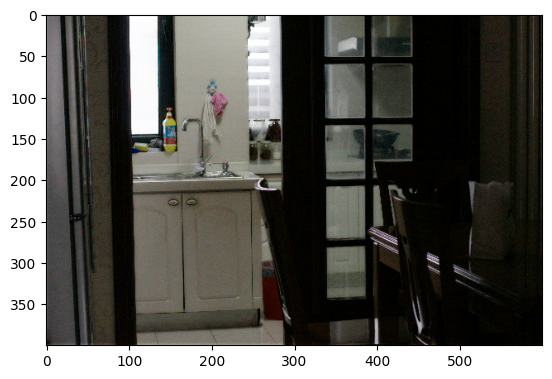

In [ ]:
# 7 iteration

# 1st iteration
img = X[3]
h, w,c = img.shape
test = Model_Enhancer.predict(img.reshape(1,h,w,c))
img = img/255
image = img + ((test[0,:,:,:] * img)*(1-img))

# 2nd iteration
test = Model_Enhancer.predict(image.reshape(1,h,w,c))
image = image + ((test[0,:,:,:] * image)*(1-image))

# 3rd iteration
test = Model_Enhancer.predict(image.reshape(1,h,w,c))
image = image + ((test[0,:,:,:] * image)*(1-image))

# 4th iteration
test = Model_Enhancer.predict(image.reshape(1,h,w,c))
image = image + ((test[0,:,:,:] * image)*(1-image))

# 5th iteration
test = Model_Enhancer.predict(image.reshape(1,h,w,c))
image = image + ((test[0,:,:,:] * image)*(1-image))

# 6th iteration
test = Model_Enhancer.predict(image.reshape(1,h,w,c))
image = image + ((test[0,:,:,:] * image)*(1-image))

# 7th iteration
test = Model_Enhancer.predict(image.reshape(1,h,w,c))
image = image + ((test[0,:,:,:] * image)*(1-image))

plt.imshow(image)

In [ ]:
# Our Model may not give good results with only one iteration, So we will perform certain number of
# iterations(greater than 1) to improve the results.

# img ==> low light image.
# index ==> Number of iterations.
# Purpose of using flag ==> To normalize the image for one time only.
def Enhance(img, index, flag):
    if index == 0:
      return img

    elif flag == 1:
        # h, w, c are the height , width and no. of channel of image
        h, w, c = img.shape
        # predicting the image
        test = Model_Enhancer.predict(img.reshape(1, h, w, 3))
        temp = img / 255
        image = temp + ((test[0,:,:,:] * temp)*(1-temp))
        index = index - 1
        flag = 0
        return Enhance(image, index, flag)

    else:
        h, w, c = img.shape
        temp = Model_Enhancer.predict(img.reshape(1, h, w, 3))
        image = img + ((temp[0,:,:,:] * img)*(1-img))
        index = index - 1
        return Enhance(image, index, flag)

In [ ]:
path = r'/content/LOLdataset/eval15/low'
all_files = glob.glob(path + "/*")
x = list()
all_files.sort()
for fileName in all_files:
        img = imageio.imread(fileName)
        x.append(img)
X_ = np.array(x)

<ipython-input-55-ca358f50e29b>:6: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(fileName)
<ipython-input-55-ca358f50e29b>:8: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X_ = np.array(x)


1/1 [==============================] - 1s 536ms/step


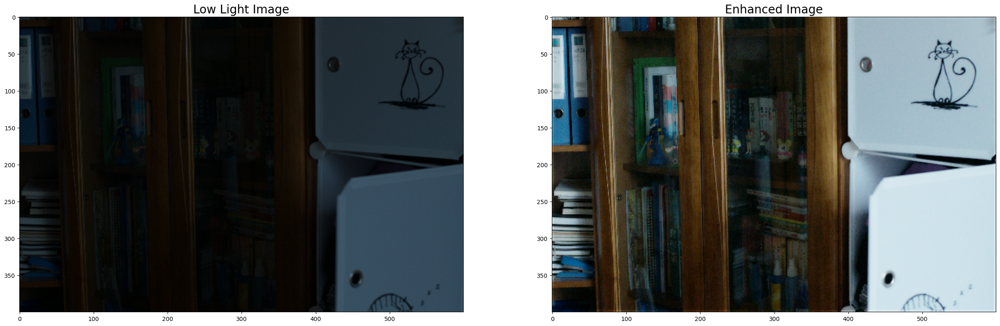

In [ ]:
Image = X_[0]

plt.figure(figsize=(30,30))

plt.subplot(1,2,1)
plt.title("Low Light Image",fontsize=20)
plt.imshow(Image)

plt.subplot(1,2,2)
plt.title("Enhanced Image",fontsize=20)
plt.imshow(Enhance(Image, 8, 1))

1/1 [==============================] - 1s 672ms/step


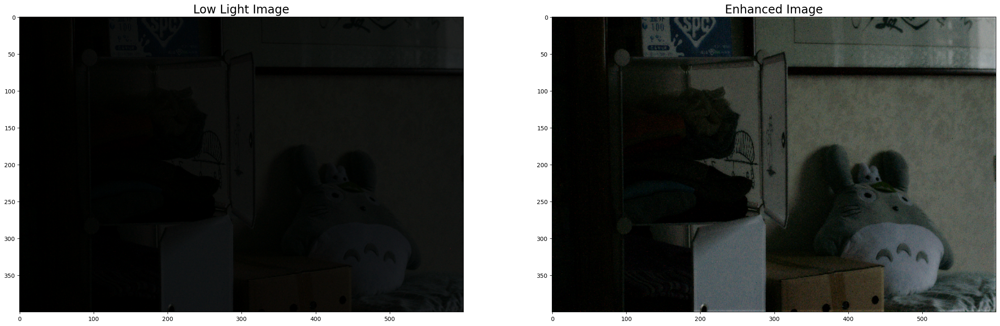

In [ ]:
Image = X_[5]

plt.figure(figsize=(30,30))

plt.subplot(1,2,1)
plt.title("Low Light Image",fontsize=20)
plt.imshow(Image)

plt.subplot(1,2,2)
plt.title("Enhanced Image",fontsize=20)
plt.imshow(Enhance(Image, 8, 1))

1/1 [==============================] - 1s 532ms/step


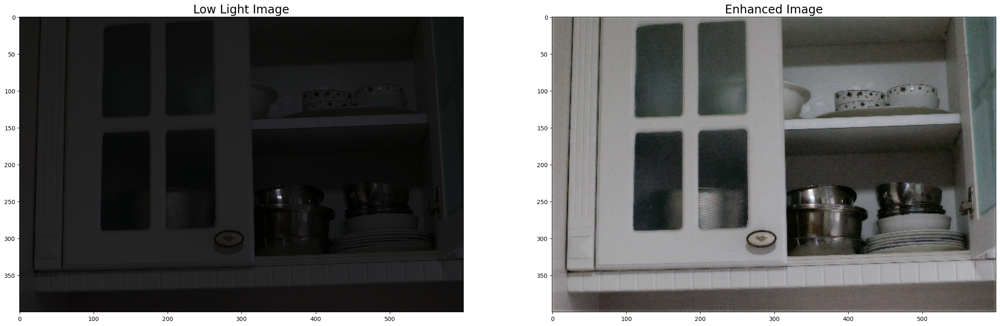

In [ ]:
Image = X_[14]

plt.figure(figsize=(30,30))

plt.subplot(1,2,1)
plt.title("Low Light Image",fontsize=20)
plt.imshow(Image)

plt.subplot(1,2,2)
plt.title("Enhanced Image",fontsize=20)
plt.imshow(Enhance(Image, 8, 1))

1/1 [==============================] - 1s 1s/step


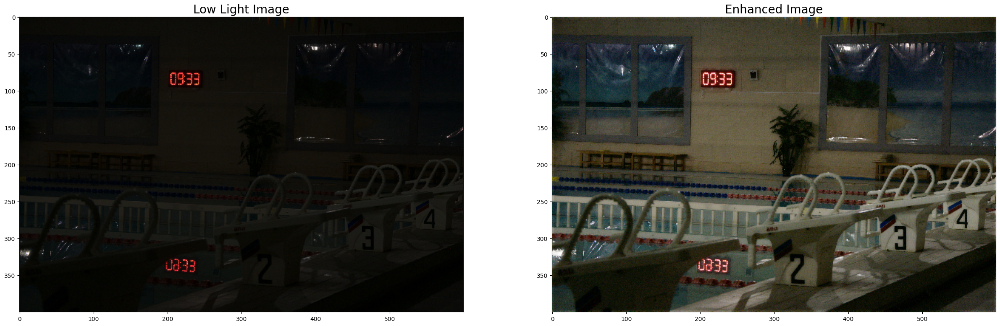

In [ ]:
Image = X_[12]

plt.figure(figsize=(30,30))

plt.subplot(1,2,1)
plt.title("Low Light Image",fontsize=20)
plt.imshow(Image)

plt.subplot(1,2,2)
plt.title("Enhanced Image",fontsize=20)
plt.imshow(Enhance(Image, 8, 1))

In [ ]:
import onnxmltools
from tensorflow.keras.models import load_model

# Load the Keras model
keras_model = load_model('/content/ourModel.h5')

# Convert the Keras model to ONNX
onnx_model = onnxmltools.convert.convert_keras(keras_model)

# Save the ONNX model to a file
onnx_path = '/content/ourModel.onnx'
onnxmltools.utils.save_model(onnx_model, onnx_path)
